<a href="https://colab.research.google.com/github/mastersigat/Script_Python_M2SIGAT/blob/main/Analyse_DVF.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Configuration environnement de travail


In [ ]:
#Initialisation de l'environnement avec geopandas
!apt update
!apt install gdal-bin python-gdal python3-gdal 
# Install rtree - Geopandas requirment
!apt install python3-rtree 
# Install Geopandas
!git clone https://github.com/geopandas/geopandas.git
!pip install geopandas
# Instal contextily (fonds de carte)
!pip install contextily
# Install mapclassify (cartographie thématique)
!pip install mapclassify
#Depuis sa version 0.8, Geopandas peut fonctionner de manière expérimental avec Pygeos ce qui accèlère certaines opérations
!pip install pygeos
# Pour la cartographie interactive
!pip install folium
# Install MatplotLib
! pip install matplotlib
# Install Pandas
! pip install pandas 
! pip install altair


In [ ]:
#Importation des librairies nécessaires
import pandas as pd #Gestion de données
import matplotlib.pyplot as plt
from shapely.geometry import Point
import geopandas as gpd #Gestion données spatiales
import pygeos #Opérations sur les géométrie de données spatiales
import contextily as ctx #Fonds de carte
import numpy as np #Manipulation de tableaux
import shapely #Manipulation de géométrie
from shapely.geometry import LineString, Point, Polygon
import folium #Cartographie interactive
import mapclassify #Cartographie thématique
import plotly.express as px
import altair as alt


In [ ]:
#Téléchargement des datas depuis le site data.gouv.fr pour le département 22, 35, 56 et 29 entre 2017 et 2020
!wget -O 2017_22.zip https://files.data.gouv.fr/geo-dvf/latest/csv/2017/departements/22.csv.gz
!wget -O 2018_22.zip https://files.data.gouv.fr/geo-dvf/latest/csv/2018/departements/22.csv.gz
!wget -O 2019_22.zip https://files.data.gouv.fr/geo-dvf/latest/csv/2019/departements/22.csv.gz
!wget -O 2020_22.zip https://files.data.gouv.fr/geo-dvf/latest/csv/2020/departements/22.csv.gz

!wget -O 2017_35.zip https://files.data.gouv.fr/geo-dvf/latest/csv/2017/departements/35.csv.gz
!wget -O 2018_35.zip https://files.data.gouv.fr/geo-dvf/latest/csv/2018/departements/35.csv.gz
!wget -O 2019_35.zip https://files.data.gouv.fr/geo-dvf/latest/csv/2019/departements/35.csv.gz
!wget -O 2020_35.zip https://files.data.gouv.fr/geo-dvf/latest/csv/2020/departements/35.csv.gz

!wget -O 2017_56.zip https://files.data.gouv.fr/geo-dvf/latest/csv/2017/departements/56.csv.gz
!wget -O 2018_56.zip https://files.data.gouv.fr/geo-dvf/latest/csv/2018/departements/56.csv.gz
!wget -O 2019_56.zip https://files.data.gouv.fr/geo-dvf/latest/csv/2019/departements/56.csv.gz
!wget -O 2020_56.zip https://files.data.gouv.fr/geo-dvf/latest/csv/2020/departements/56.csv.gz

!wget -O 2017_29.zip https://files.data.gouv.fr/geo-dvf/latest/csv/2017/departements/29.csv.gz
!wget -O 2018_29.zip https://files.data.gouv.fr/geo-dvf/latest/csv/2018/departements/29.csv.gz
!wget -O 2019_29.zip https://files.data.gouv.fr/geo-dvf/latest/csv/2019/departements/29.csv.gz
!wget -O 2020_29.zip https://files.data.gouv.fr/geo-dvf/latest/csv/2020/departements/29.csv.gz

In [ ]:
#Importer toutes les couches 
CA_2017= pd.read_csv("2017_22.zip", compression='gzip')
CA_2018= pd.read_csv("2018_22.zip", compression='gzip')
CA_2019= pd.read_csv("2019_22.zip", compression='gzip')
CA_2020= pd.read_csv("2020_22.zip", compression='gzip')

IeV_2017= pd.read_csv("2017_35.zip", compression='gzip')
IeV_2018= pd.read_csv("2018_35.zip", compression='gzip')
IeV_2019= pd.read_csv("2019_35.zip", compression='gzip')
IeV_2020= pd.read_csv("2020_35.zip", compression='gzip')

MN_2017= pd.read_csv("2017_56.zip", compression='gzip')
MN_2018= pd.read_csv("2018_56.zip", compression='gzip')
MN_2019= pd.read_csv("2019_56.zip", compression='gzip')
MN_2020= pd.read_csv("2020_56.zip", compression='gzip')

FI_2017= pd.read_csv("2017_29.zip", compression='gzip')
FI_2018= pd.read_csv("2018_29.zip", compression='gzip')
FI_2019= pd.read_csv("2019_29.zip", compression='gzip')
FI_2020= pd.read_csv("2020_29.zip", compression='gzip')

#Nettoyage des données

##Etape 0> regrouper toutes les années de 2016 jusqu'en 2020 en 1 tableur

In [ ]:
#On stock le nom de tous les dataframes dans une liste
frames = [CA_2017, CA_2018, CA_2019, CA_2020, IeV_2017, IeV_2018, IeV_2019, IeV_2020, MN_2017, MN_2018, MN_2019, MN_2020, FI_2017, FI_2018, FI_2019, FI_2020]

#On fait l'union de toute les listes
result = pd.concat(frames)

##Etape 1> Séléction des mutations de type "Ventes" de "Maison" et "Appartements'

In [ ]:
Etape1 = result.loc[result["nature_mutation"]=='Vente']
Etape1 = Etape1.loc[(Etape1["type_local"]=='Maison')|(Etape1["type_local"]=='Appartement')]

##Etape2> Sélection et renommage des variables


In [ ]:
#réorganiser la table :
#on garde uniquement les colonnes qui nous intéressent
Etape2 = Etape1[["id_mutation", "numero_disposition", "id_parcelle", "date_mutation", "nature_mutation", "code_commune", "code_departement", "type_local", "surface_reelle_bati", "nombre_pieces_principales", "valeur_fonciere" , "latitude" , "longitude"  ]]
#On renome les colonnes :
Etape2.rename(columns={'id_mutation':'id','numero_disposition' : 'disposition', 'id_parcelle' : 'parcelle', 'date_mutation' : 'date', 'nature_mutation' : 'nature', 'code_commune' :  'codecommune' , 'code_departement' : 'departement', 'type_local' : 'type', 'surface_reelle_bati' : 'surface', 'nombre_pieces_principales' : 'piece', 'valeur_fonciere' : 'prix'}, inplace=True)
Etape2.head()

##Etape 3> Remplacement des cellules vides par des NA et suppression des NA (Marche pas car les colonnes numériques restent en NA)

In [ ]:
#suppession des blanks par NaN 
Etape3=Etape2.replace(r'^\s*$', np.nan, regex=True)

#Suppresion des NaN
Etape3=Etape3.dropna()

#Check
print("Nombre d'enregistrement avec les NaN --> ", len(Etape2)," // Sans NaN --> ", len(Etape3))

##Etape4> Sélections des mutations simples

#####Regrouper les transactions selon l'ID, la surface et la vente

In [ ]:
#Retirer les doublons
Unique=Etape3.drop_duplicates(subset=['id','prix', 'surface'])

#Nb unique
Nb_unique=Unique.groupby(['id']).size().reset_index(name='ctn')

sum(Nb_unique['ctn'])


#####Suppression des doublons et des mutations multiventes

In [ ]:
#On garde les unique
Etape4=Nb_unique.loc[Nb_unique["ctn"]==1]

##Etape5> Jointure attributaire pour récupérer les informations de la mutation

In [ ]:
#Right join avant de garder uniquement les non doublons
Etape3=Etape3.drop_duplicates(subset=['id','surface','prix'])
Etape5=pd.merge(Etape3, Etape4, on='id', how='right')

In [ ]:
Etape5=pd.merge(Etape4, Etape3, on='id')
Etape5=Etape5.drop_duplicates(subset=['id'])

######Modification des formats des colonnes

In [ ]:
Etape5["prix"] = pd.to_numeric(Etape5["prix"])
Etape5["surface"] = pd.to_numeric(Etape5["surface"], downcast='integer')
Etape5["piece"] = pd.to_numeric(Etape5["piece"])

####Suppression des valeurs aberrantes

Fixer un seuil minimal des prix (percentile)

In [ ]:
Etape5['prix'].quantile(0.01) #valeur_fonciere à remplacer par prix

Fixer un seuil maximal des prix (histogramme)

In [ ]:
ax=Etape5['prix'].hist(bins=100)
ax.set_xlim(0,5000000)

##Etape 6> Sélection des bornes de prix et de surface

In [ ]:
#Gestion des prix extremes
Etape6=Etape5.loc[Etape5['prix'].between(15000, 5000000)]

#Gestion des surfaces extremes
Etape6=Etape6.loc[((Etape6['type']=='Maison') & Etape6['surface'].between(9, 350)) | ((Etape6['type']=='Appartement') & Etape6['surface'].between(10, 200))]       

#Création du prix au m² et filtre des valeurs extrêmes et aberrantes


##Etape7> Création de la variable prix/m²


In [ ]:
Etape7 = Etape6
Etape7["Prixm2"] = Etape7['prix']/Etape7['surface']
Etape7.head(3)

##Etape8 > Sélection des bornes de prix au m²


In [ ]:
#Fixer un seuil minimal des prix au m² (percentile)
Etape7['Prixm2'].quantile(0.01)

In [ ]:
#Fixer un seuil maximal des prix au m² (histogramme)
ax=Etape7['Prixm2'].hist(bins=1000)
ax.set_xlim(0,10000)

In [ ]:
#Filtres des valeurs
Etape8 = Etape7.loc[Etape6['Prixm2'].between(330, 8000)]
len(Etape8)

In [ ]:
#Transformation de la date en année
Etape8['annee'] = Etape8['date'].str[:4]
Etape8.head()


#Enrichissement des mutations avec de nouvelles variables (commune, intercommunalité, département)

###Etape9 >Ajout de variables relatives à la commune (Nom et code de l'EPCI, Nom et code du département

#####Import des data COG

In [ ]:
!wget -O COG_com.csv https://www.insee.fr/fr/statistiques/fichier/6051727/commune_2022.csv
!wget -O COG_dep.csv https://www.insee.fr/fr/statistiques/fichier/6051727/departement_2022.csv
!wget -O COG_EPCI.zip https://www.insee.fr/fr/statistiques/fichier/2510634/Intercommunalite_Metropole_au_01-01-2022.zip


#####Lecture des datas COG

In [ ]:
COG_com=pd.read_csv("COG_com.csv")
COG_dep=pd.read_csv("COG_dep.csv")

#Import des EPCI
import zipfile
archive = zipfile.ZipFile('COG_EPCI.zip', 'r')
xlfile = archive.open('Intercommunalite_Metropole_au_01-01-2022.xlsx')
COG_EPCI = pd.read_excel(xlfile, sheet_name='Composition_communale', skiprows=5)


Mise au propre des data COG

In [ ]:
#COG Commune: On garde Code insee, code dep, code EPCI, nom de la commune
COG_com=COG_com[["COM", "DEP", "CTCD", "NCC"]]

#COG Dep: On garde code dep et nom dep
COG_dep=COG_dep.rename(columns = {"NCC" : "Nom_dep"})[['DEP', 'Nom_dep']]

#COG EPCI: On garde code dep et nom EPCI
COG_EPCI=COG_EPCI.rename(columns = {"LIBEPCI" : "Nom_EPCI"})[['CODGEO', 'Nom_EPCI']]

Couche unique du COG

In [ ]:
#Merge des 3 dataframes
COG=pd.merge(COG_com, COG_dep, how='inner', left_on=['DEP'], right_on=['DEP'])
COG=pd.merge(COG, COG_EPCI, how='inner', left_on=['COM'], right_on=['CODGEO'])
COG.head()

Ajout des infos COG dans les DVFs

In [ ]:
#Conversion du champ Code Insee en chaine de caractères (pour la jointure, les clés doivent être du même type)
COG['COM']=COG['COM'].astype(str)
Etape8['codecommune']=Etape8['codecommune'].astype(str)
Etape9=pd.merge(Etape8, COG, how='inner', left_on=['codecommune'], right_on=['COM'])
Etape9.head()

In [ ]:
#Renommage et selection des colonnes
DVFOK=Etape9.rename(columns = {"NCC" : "Nom_commune"})[['id', 'parcelle', 'date', 'annee', 'type', 'prix', 'surface', 'Prixm2', 'codecommune', 'Nom_commune', 'DEP', 'Nom_dep', 'Nom_EPCI',  'latitude', 'longitude']]
DVFOK.head()

In [ ]:
#Nombre de lignes - fin
len(DVFOK)

In [ ]:
#Export
DVFOK.to_csv('DVFOK.csv', sep=';', encoding='utf-8')

#Ajout des communes en shp de Bretagne

In [ ]:
!wget -O communes.geojson https://public.opendatasoft.com/explore/dataset/georef-france-commune/download/?format=geojson&disjunctive.reg_name=true&disjunctive.dep_name=true&disjunctive.arrdep_name=true&disjunctive.ze2020_name=true&disjunctive.bv2012_name=true&disjunctive.epci_name=true&disjunctive.ept_name=true&disjunctive.com_name=true&disjunctive.ze2010_name=true&disjunctive.com_is_mountain_area=true&refine.reg_name=Bretagne&timezone=Europe/Berlin&lang=fr

In [ ]:
#Chargement de la couche commune de toute la france
communes= gpd.read_file("communes.geojson", encoding='utf-8')
communes = communes[["reg_code", "dep_code", "dep_name", "com_code", "com_name", "geometry"]]

In [ ]:
#garder que les communes de Bretagne 
communesbzhok = communes.loc[(communes["dep_code"]=='22')|(communes["dep_code"]=='29')|(communes["dep_code"]=='35')|(communes["dep_code"]=='56')]
communesbzhok.plot()

#Carte 1 : nombre de vente par commune

## Cartographie

In [ ]:
#Cartographier le nombre de vente par communes
nb_vente  = DVFOK[["codecommune"]].groupby("codecommune").size().reset_index(name='nb_transaction')

#spatialisation
nb_vente2 = communesbzhok.merge(nb_vente, how='outer', left_on='com_code', right_on='codecommune')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.




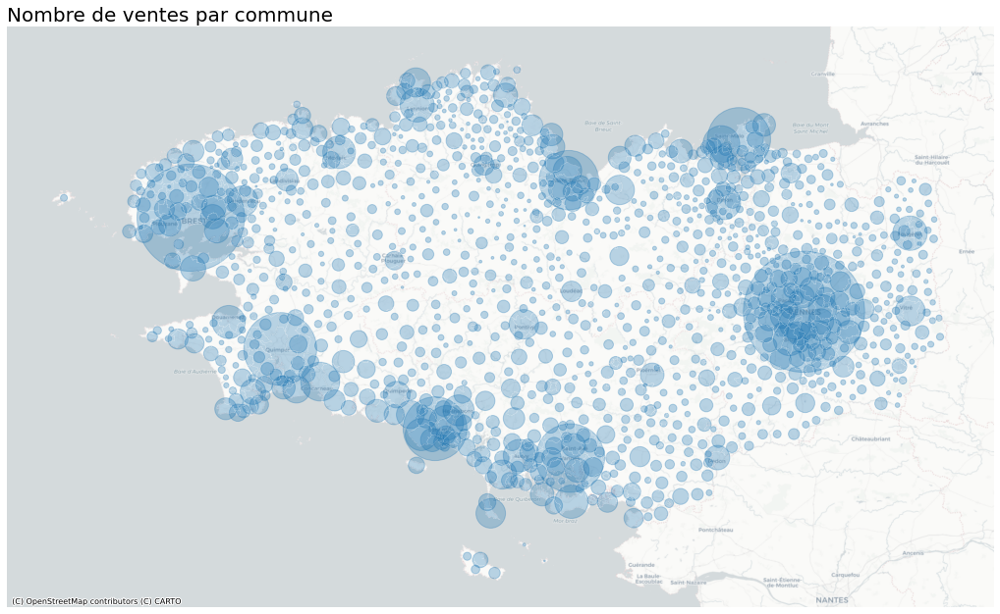

In [ ]:
#Carte cercle prop du nombre de ventes par commune
nb_vente2.geometry = nb_vente2['geometry'].centroid
Carte1, ax = plt.subplots(figsize=(18,16))
communesbzhok.boundary.to_crs('EPSG:3857').plot(ax=ax, linewidth=0.1, color = 'white')
nb_vente2.to_crs('EPSG:3857').plot(ax=ax, markersize="nb_transaction",  alpha=0.3)
ctx.add_basemap(ax,  source=ctx.providers.CartoDB.Positron)
ax.axis("off")
plt.title("Nombre de ventes par commune", loc='left', fontsize=20)
plt.show()

## Graphique 

In [ ]:
#Nombre de ventes par département
nb_vente_dep  = DVFOK[["Nom_dep"]].groupby(["Nom_dep"]).size().reset_index(name='counts')
fig = px.pie(nb_vente_dep, values='counts', names='Nom_dep')
fig.show()

# Carte 2 : Evolution des ventes par commune entre 2019 et 2020

##Cartographie

In [ ]:
#calcul taux evolution
nb_ventea  = DVFOK[["codecommune", "annee"]].groupby(["codecommune", "annee"]).size().reset_index(name='counts')
#Passage de long en large
nb_ventea = nb_ventea.pivot(index='codecommune',columns='annee',values='counts')
nb_ventea["evolution"]=(nb_ventea["2020"]-nb_ventea["2019"])/nb_ventea["2019"]*100
nb_ventea = communesbzhok.merge(nb_ventea, how='outer', left_on='com_code', right_on='codecommune')

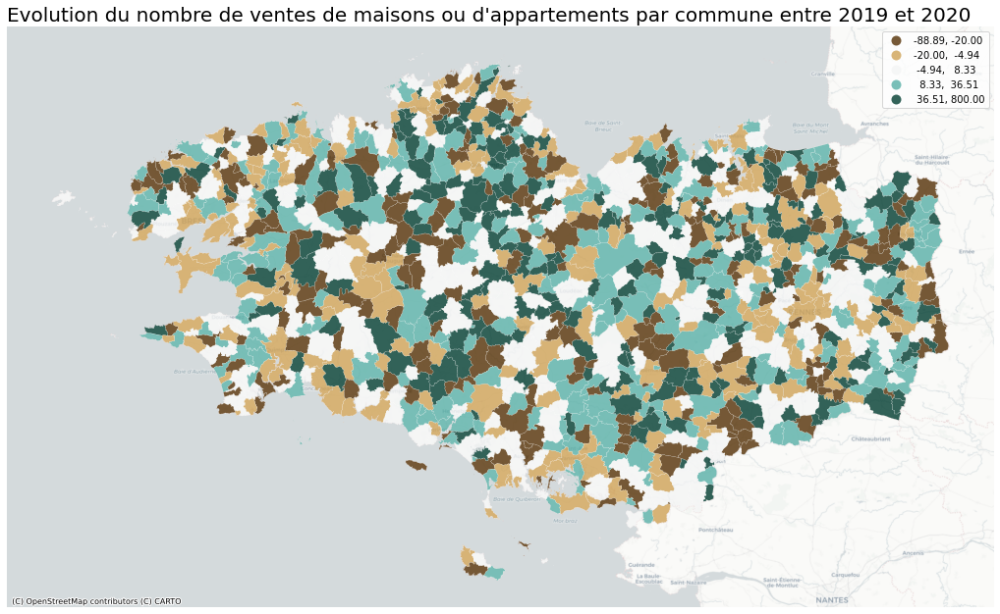

In [ ]:
Carte1, ax = plt.subplots(figsize=(18,16))
communesbzhok.boundary.to_crs('EPSG:3857').plot(ax=ax, linewidth=0.1, color = 'white')
nb_ventea.to_crs('EPSG:3857').plot(ax=ax, markersize="evolution", column="evolution", alpha=0.8, cmap='BrBG',scheme='quantiles', categorical=False, legend=True)
ctx.add_basemap(ax,  source=ctx.providers.CartoDB.Positron)
plt.title("Evolution du nombre de ventes de maisons ou d'appartements par commune entre 2019 et 2020", loc='left', fontsize=20)
ax.axis("off")
plt.show()

## Graphique

In [ ]:
#Préparation du tableur
nb_ventea_dep  = nb_ventea[["dep_name", "evolution"]].groupby("dep_name").mean()
nb_ventea_dep = nb_ventea_dep.sort_values("evolution", ascending=True)

nb_ventea_dep.head()

In [ ]:
#Graphique : moyenne des évolution du nombre de ventes de maisons ou d'appartements par département entre 2019 et 2020
nb_ventea_dep.plot(kind="barh")

#Carte 3 : prix moyen au m² par communes


## Cartographie

In [ ]:
#on créer un nouveau tableur ave le code commune et le prix au m² par commune
prixm2  = DVFOK[["codecommune", "Prixm2"]].groupby("codecommune").mean()
prixm2.head()

In [ ]:
#joindre ce tableur au communes en shp (spatialisation)
prixm2spa = communesbzhok.merge(prixm2, left_on='com_code', right_on='codecommune')

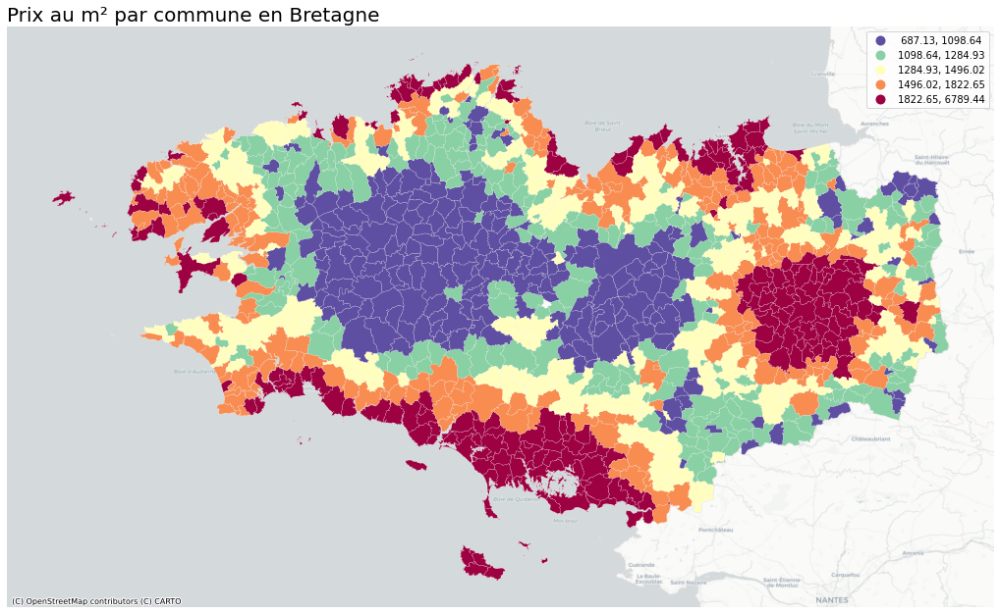

In [ ]:
#Cartographier prix m² par commune

Carte1, ax = plt.subplots(figsize=(18,16))
prixm2spa.boundary.to_crs('EPSG:3857').plot(ax=ax, linewidth=0.1, color = 'white')
prixm2spa.to_crs('EPSG:3857').plot(ax=ax, markersize="Prixm2", column="Prixm2", alpha=1, cmap='Spectral_r',scheme='quantiles', categorical=False, legend=True)
ctx.add_basemap(ax,  source=ctx.providers.CartoDB.Positron)
plt.title("Prix au m² par commune en Bretagne", loc='left', fontsize=20)
ax.axis("off")
plt.show()

## Graphique :

In [ ]:
#Préparation du tableur
prixm2_dep  = DVFOK[["Nom_dep", "Prixm2"]].groupby("Nom_dep").mean()
prixm2_dep = prixm2_dep.sort_values("Prixm2", ascending=True)

prixm2_dep.head()

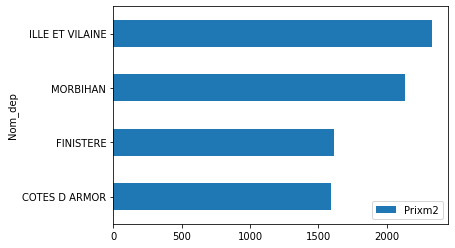

In [ ]:
#Graphique : moyenne du prix au m² par département
prixm2_dep.plot(kind="barh")

#Carte 4 : évolution moyen du prix par commune entre 2017 et 2020

## Cartographie

In [ ]:
varprix  = DVFOK[["codecommune", "annee", "Prixm2"]].groupby(["codecommune", "annee"])['Prixm2'].mean().reset_index(name='mean')
varprix = varprix.pivot(index='codecommune',columns='annee',values='mean')
#Taux evolution moyen entre 2020 et 2017
varprix["evolution"]= (((varprix["2018"]-varprix["2017"])/varprix["2017"]*100)+((varprix["2019"]-varprix["2018"])/varprix["2018"]*100)+((varprix["2020"]-varprix["2019"])/varprix["2019"]*100))/3
#Spatialisation
varprix = communesbzhok.merge(varprix, how='outer', left_on='com_code', right_on='codecommune')

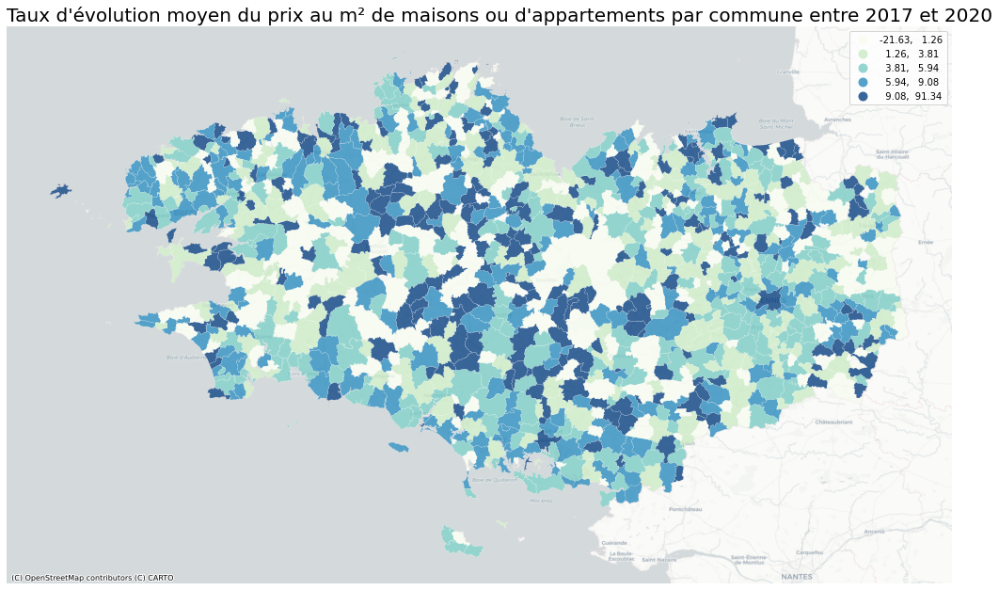

In [ ]:
Carte3, ax = plt.subplots(figsize=(18,16))
communesbzhok.boundary.to_crs('EPSG:3857').plot(ax=ax, linewidth=0.1, color = 'white')
varprix.to_crs('EPSG:3857').plot(ax=ax, markersize="evolution", column="evolution", alpha=0.8, cmap='GnBu',scheme='quantiles', categorical=False, legend=True)
ctx.add_basemap(ax,  source=ctx.providers.CartoDB.Positron)
plt.title("Taux d'évolution moyen du prix au m² de maisons ou d'appartements par commune entre 2017 et 2020", loc='left', fontsize=20)
ax.axis("off")
plt.show()

## Graphique

In [ ]:
#Préparation du tableur
varprix_dep  = varprix[["dep_name", "evolution"]].groupby("dep_name").mean()
varprix_dep = varprix_dep.sort_values("evolution", ascending=True)

varprix_dep.head()

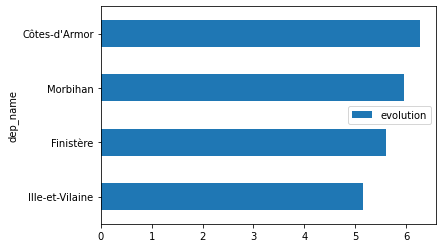

In [ ]:
#Graphique : moyenne du taux d'évolution moyen du prix au m² de maisons ou d'appartements par commune entre 2017 et 2020
varprix_dep.plot(kind="barh")

# Carte 5 : Small multiple des prix moyens par commune

In [ ]:
varprix  = DVFOK[["codecommune", "annee", "Prixm2"]].groupby(["codecommune", "annee"])['Prixm2'].mean().reset_index(name='mean')
#Spatialisation
varprix = communesbzhok.merge(varprix, how='outer', left_on='com_code', right_on='codecommune')
varprix.head()


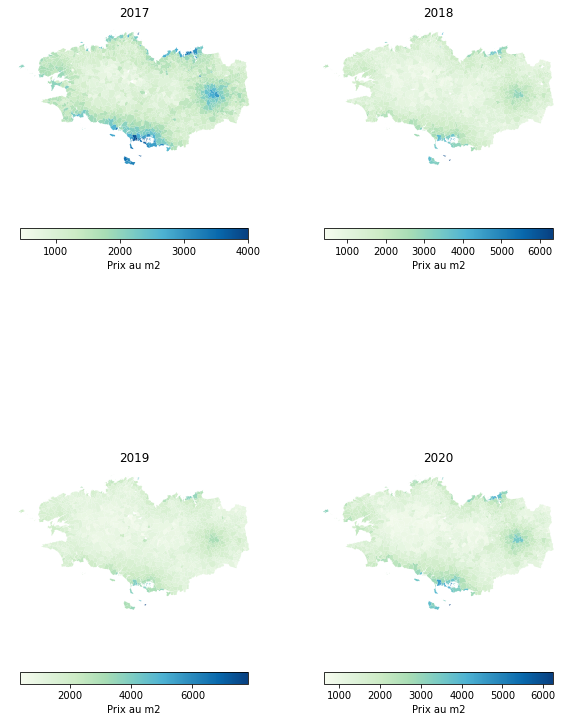

In [ ]:
list_an=['2017', '2018', '2019', '2020']
fig, axes = plt.subplots(ncols=2, nrows=2, figsize=(10,15))
i = 0
for dec in sorted(list_an): #list_an = liste année dans le DF
  j = i%2 # column
  ax = axes[i//2, j]
  ax.title.set_text(f"{dec}")
  ax.axis("off")
  df = varprix.query("annee == @dec") # annee=annee de la boucle

  df.plot(column='mean',cmap='GnBu',legend=True, edgecolor="white", figsize = (15,20), linewidth = 0.01, legend_kwds={'label': "Prix au m2",
                          'orientation': "horizontal", 'shrink': 0.9}, ax = ax)
  i = i+1

#Carte 6 : Où sont situés les ventes de type maison

---



In [ ]:
#garder uniquement les lignes = à maison 
maisons = DVFOK.loc[(DVFOK["type"]=='Maison')]

In [ ]:
#regrouper nb maisons par communes
maisons=maisons[["codecommune","type"]].groupby("codecommune").size()
maisons =pd.DataFrame(maisons) #on le transforme en dataframe
maisons = maisons.rename(columns={0: 'nb_maisons'}) #on renomme car automatiquement il le nome 0
maisons.head(10)

In [ ]:
#on récupère la géométrie des communes de bretagne
maisonspa = communesbzhok.merge(maisons, left_on='com_code', right_on='codecommune')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.




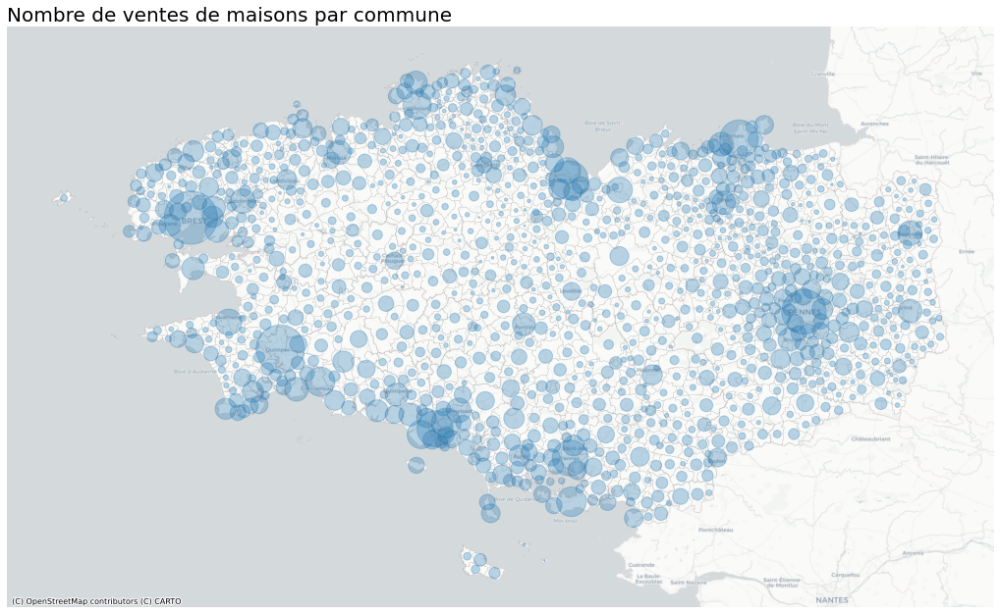

In [ ]:
#ou sont situés les transactions de type maison
maisonspa.geometry = maisonspa['geometry'].centroid
Carte6, ax = plt.subplots(figsize=(18,16))
communesbzhok.boundary.to_crs('EPSG:3857').plot(ax=ax, linewidth=0.1, color = 'grey')
maisonspa.to_crs('EPSG:3857').plot(ax=ax, markersize="nb_maisons",  alpha=0.3)
ctx.add_basemap(ax,  source=ctx.providers.CartoDB.Positron)
ax.axis("off")
plt.title("Nombre de ventes de maisons par commune", loc='left', fontsize=20)
plt.show()

#Carte 7 :  Où sont situés les ventes de type appartement

In [ ]:
#garder uniquement les lignes = à appartement 
appart = DVFOK.loc[(DVFOK["type"]=='Appartement')]

In [ ]:
#regrouper nb appart par communes 
appart=appart[["codecommune","type"]].groupby("codecommune").size()
appart =pd.DataFrame(appart) #on le transforme en dataframe
appart = appart.rename(columns={0: 'nb_appart'}) #on renomme car automatiquement il le nome 0
appart.head(10)

In [ ]:
#on récupère la géométrie des communes de bretagne
appartspa = communesbzhok.merge(appart, left_on='com_code', right_on='codecommune')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.




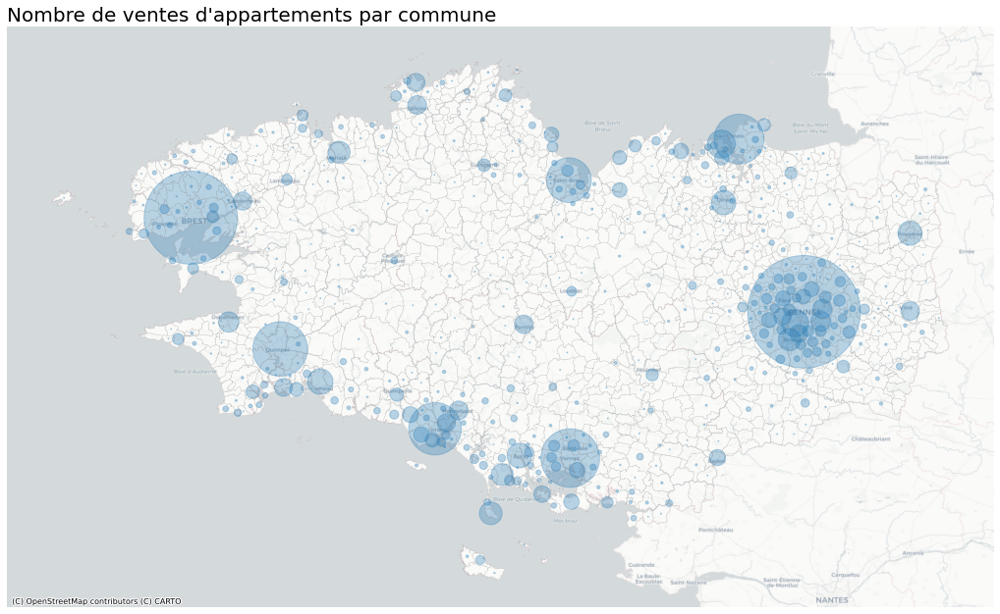

In [ ]:
#ou sont situés les transactions de type appartement 
appartspa.geometry = appartspa['geometry'].centroid
Carte6, ax = plt.subplots(figsize=(18,16))
communesbzhok.boundary.to_crs('EPSG:3857').plot(ax=ax, linewidth=0.1, color = 'grey')
appartspa.to_crs('EPSG:3857').plot(ax=ax, markersize="nb_appart",  alpha=0.3)
ctx.add_basemap(ax,  source=ctx.providers.CartoDB.Positron)
ax.axis("off")
plt.title("Nombre de ventes d'appartements par commune", loc='left', fontsize=20)
plt.show()

#Carte 8 : Proportion d'appartement

In [ ]:
part_appart  = DVFOK[["codecommune", "type"]].groupby(["codecommune", "type"]).size().reset_index(name='count')
part_appart = part_appart.pivot(index='codecommune',columns='type',values='count')
#Replace nul par 0
part_appart[['Appartement', 'Maison']] = part_appart[['Appartement', 'Maison']].fillna(0)
#Part d'appart dans les ventes
part_appart["prop"] = part_appart['Appartement']/(part_appart['Appartement']+part_appart['Maison'])*100
part_appart['prop'] = part_appart['prop'].fillna(0)
part_appart = communesbzhok.merge(part_appart, how='outer', left_on='com_code', right_on='codecommune')
part_appart.head()

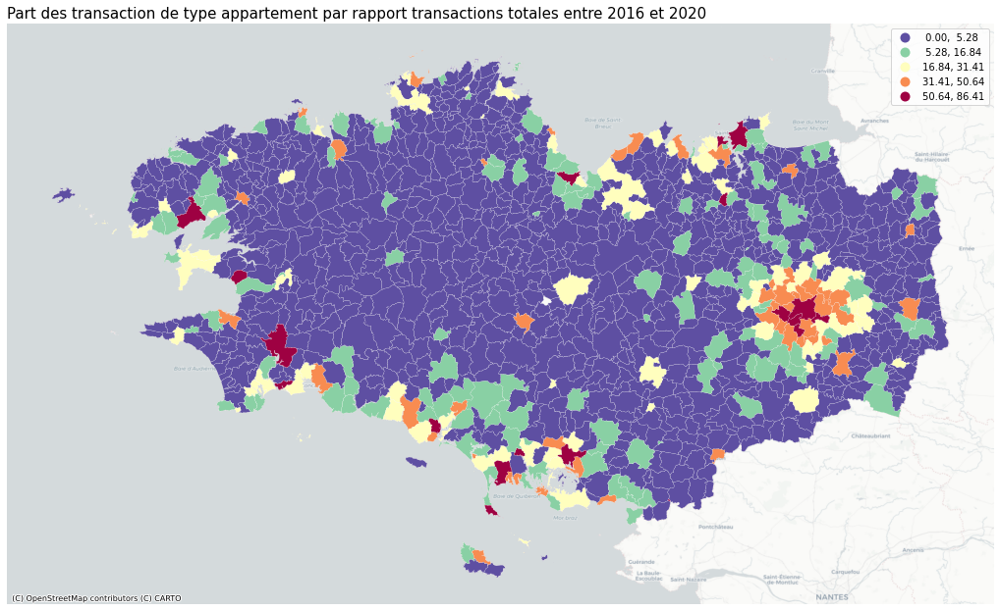

In [ ]:
#affichage de la carte
Carte5, ax = plt.subplots(figsize=(18,16))
part_appart.boundary.to_crs('EPSG:3857').plot(ax=ax, linewidth=0.1, color = 'white')
part_appart.to_crs('EPSG:3857').plot(ax=ax, markersize="prop", column="prop", alpha=1, cmap='Spectral_r',scheme='fisherjenks', categorical=False, legend=True)
ctx.add_basemap(ax,  source=ctx.providers.CartoDB.Positron)
plt.title('Part des transaction de type appartement par rapport transactions totales entre 2016 et 2020', loc='left', fontsize=15)
ax.axis("off")
plt.show()


# Carte 9 : Prix m2 par carreaux à Rennes métropole 

In [ ]:
#garder que la rennes métropole 
carte9 = communesbzhok[(communesbzhok["com_name"] == 'Rennes')]
carte9.head()

#Dataframe to GeoDataframe
from geopandas import GeoDataFrame
from shapely.geometry import Point
df = DVFOK
geometry = [Point(xy) for xy in zip(df.longitude, df.latitude)]
df = df.drop(['longitude', 'latitude'], axis=1)
gdf = GeoDataFrame(df, crs="EPSG:4326", geometry=geometry)

In [ ]:
transaction_iev = gpd.overlay(gdf, carte9, how='intersection')
transaction_iev.plot()

In [ ]:
#Dataframe to GeoDataframe

transaction = gpd.GeoDataFrame(Etape6, crs = 'epsg:2154', geometry=gpd.points_from_xy(Etape6.longitude, Etape6.latitude))

transaction.head()

In [ ]:
#réaliser un carroyage autour de cette zone 
# Install H3Index (UBER)
!pip install h3
from h3 import h3

In [ ]:
#Création du maillage
h3_level = 10
 
def lat_lng_to_h3(row):
    return h3.geo_to_h3(row.geometry.y, row.geometry.x, h3_level)
 
transaction_iev['h3'] = transaction_iev.apply(lat_lng_to_h3, axis=1)
transaction_iev.head()

In [ ]:
mean  = transaction_iev[["h3", "Prixm2"]].groupby(["h3"])['Prixm2'].mean().reset_index(name='mean')
mean.head()

In [ ]:
# Création de la géométrie du maillage 

def add_geometry(row):
    points = h3.h3_to_geo_boundary(
      row['h3'], True)
    return Polygon(points)
 
mean['geometry'] = mean.apply(add_geometry, axis=1)
Mailage = gpd.GeoDataFrame(mean, crs='EPSG:4326')
Mailage.plot()
Mailage.head()

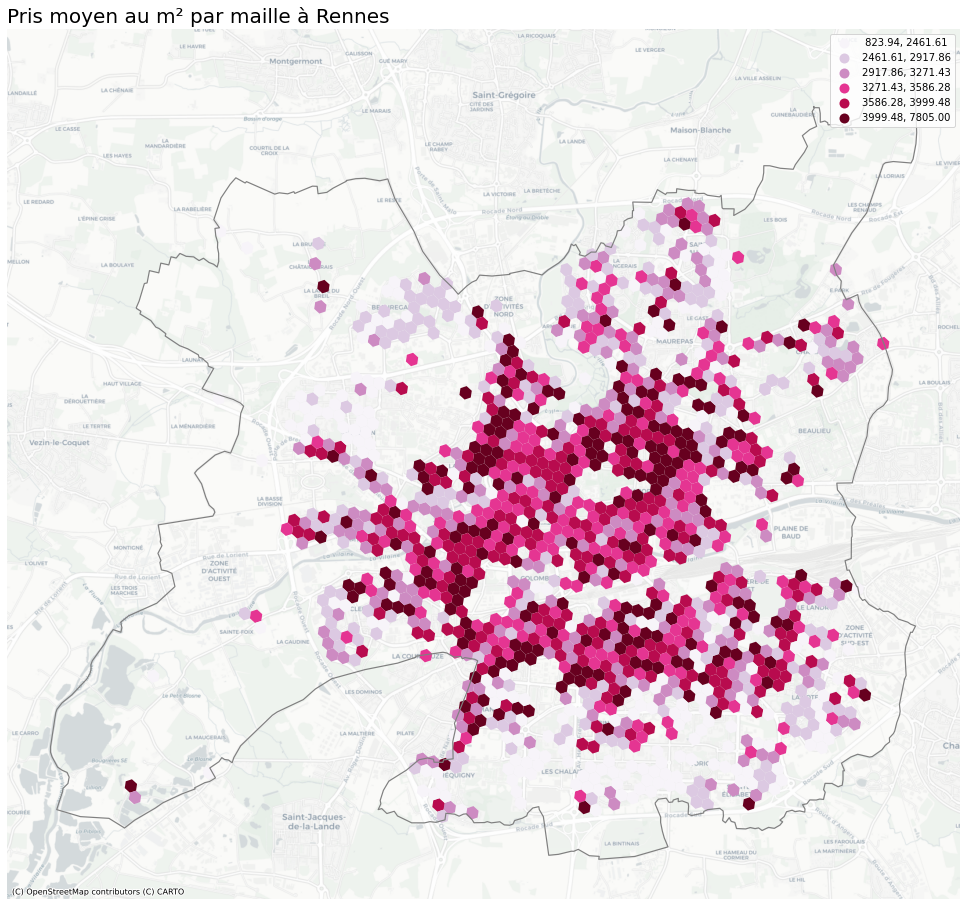

In [ ]:
# Cartographie
H3Map, ax = plt.subplots(figsize=(18,16))
Mailage.to_crs('EPSG:3857').plot(ax=ax, column='mean', figsize=(15, 10),k=6, cmap='PuRd', scheme='quantiles', legend=True)
carte9.boundary.to_crs('EPSG:3857').plot(ax=ax, linewidth=1.2, color = 'grey')
ctx.add_basemap(ax,  source=ctx.providers.CartoDB.Positron)
plt.title("Pris moyen au m² par maille à Rennes", loc='left', fontsize=20)
ax.axis("off")
plt.show()

# Carte 10 : carte interactive avec folium

In [ ]:
tableurok = communesbzhok.merge(nb_vente, how='outer' ,left_on='com_code', right_on='codecommune')
tableurok2 = tableurok.merge(prixm2, how='outer' ,left_on='com_code', right_on='codecommune')
tableurok2.head()

In [ ]:
# Faire une carte interactive avec la biliothèque Folium
map = folium.Map(
    width='60%',height='50%',
    location=[48.170107, -2.829173],
    zoom_start=7.5,
    tiles="cartodbpositron")

carte2 = folium.GeoJson(tableurok2).add_to(map)
folium.GeoJsonTooltip(['dep_name','com_name', 'nb_transaction', 'Prixm2']).add_to(carte2)



map